In [17]:
!apt update && apt install -y openslide-tools
!pip install openslide-python

Get:1 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease [3,622 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease [1,581 B]
Hit:3 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal InRelease
Get:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  Packages [975 kB]
Hit:5 http://ppa.launchpad.net/cran/libgit2/ubuntu focal InRelease
Get:6 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu focal InRelease [18.1 kB]
Get:7 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu focal InRelease [24.3 kB]
Hit:8 http://ppa.launchpad.net/ubuntugis/ppa/ubuntu focal InRelease
Get:9 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu focal/main amd64 Packages [29.5 kB]
Get:10 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu focal/main amd64 Packages [46.7 kB]
Hit:11 http://archive.ubuntu.com/ubuntu focal InRelease
Get:12 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]
Get:13 http://archive.ubu

In [18]:
# !wget "https://downloads.openmicroscopy.org/images/SVS/77917.svs"

!wget 'https://data.kitware.com/api/v1/file/5899dd6d8d777f07219fcb23/download'

--2023-04-19 02:00:41--  https://data.kitware.com/api/v1/file/5899dd6d8d777f07219fcb23/download
Resolving data.kitware.com (data.kitware.com)... 50.58.123.189
Connecting to data.kitware.com (data.kitware.com)|50.58.123.189|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 674925813 (644M) [application/octet-stream]
Saving to: ‘download’

download            100%[===================>] 643.66M  1.31MB/s    in 6m 23s  

2023-04-19 02:07:04 (1.68 MB/s) - ‘download’ saved [674925813/674925813]



In [19]:
#import pyvips
from openslide import open_slide
import openslide
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt


In [20]:
#Load the slide file (svs) into an object.
# slide = open_slide("77917.svs")
slide = open_slide("download")

slide_props = slide.properties
print(slide_props)

<_PropertyMap {'aperio.AppMag': '20', 'aperio.DSR ID': 'AP1258-DSR', 'aperio.Date': '01/21/09', 'aperio.Filename': '7566', 'aperio.Filtered': '5', 'aperio.ICC Profile': 'ScanScope v1', 'aperio.ImageID': '7566', 'aperio.Left': '28.390419', 'aperio.LineAreaXOffset': '0.021368', 'aperio.LineAreaYOffset': '-0.005374', 'aperio.LineCameraSkew': '-0.000389', 'aperio.MPP': '0.5015', 'aperio.OriginalWidth': '32640', 'aperio.Originalheight': '38574', 'aperio.ScanScope ID': 'SS1302', 'aperio.StripeWidth': '2040', 'aperio.Time': '14:38:12', 'aperio.Title': 'none', 'aperio.Top': '20.236197', 'aperio.User': 'd7f93a12-41d0-44e0-b08e-c73b751a2d26', 'openslide.comment': 'Aperio Image Library v9.0.22\r\n32640x38574 [0,100 32001x38474] (240x240) JPEG/RGB Q=70|AppMag = 20|StripeWidth = 2040|ScanScope ID = SS1302|Filename = 7566|Title = none|Date = 01/21/09|Time = 14:38:12|User = d7f93a12-41d0-44e0-b08e-c73b751a2d26|MPP = 0.5015|Left = 28.390419|Top = 20.236197|LineCameraSkew = -0.000389|LineAreaXOffset = 

In [21]:
print("Vendor is:", slide_props['openslide.vendor'])
print("Pixel size of X in um is:", slide_props['openslide.mpp-x'])
print("Pixel size of Y in um is:", slide_props['openslide.mpp-y'])

#Objective used to capture the image
objective = float(slide.properties[openslide.PROPERTY_NAME_OBJECTIVE_POWER])
print("The objective power is: ", objective)

Vendor is: aperio
Pixel size of X in um is: 0.50149999999999995
Pixel size of Y in um is: 0.50149999999999995
The objective power is:  20.0


In [22]:
# get slide dimensions for the level 0 - max resolution level
slide_dims = slide.dimensions
print(slide_dims)

(32001, 38474)


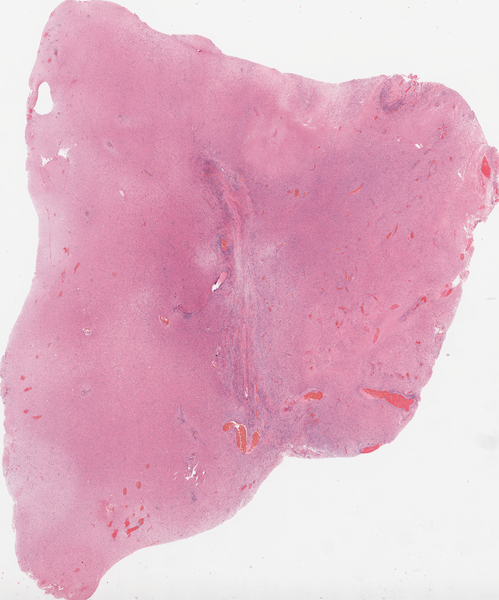

In [23]:
#Get a thumbnail of the image and visualize
slide_thumb_600 = slide.get_thumbnail(size=(600, 600))
slide_thumb_600.show()

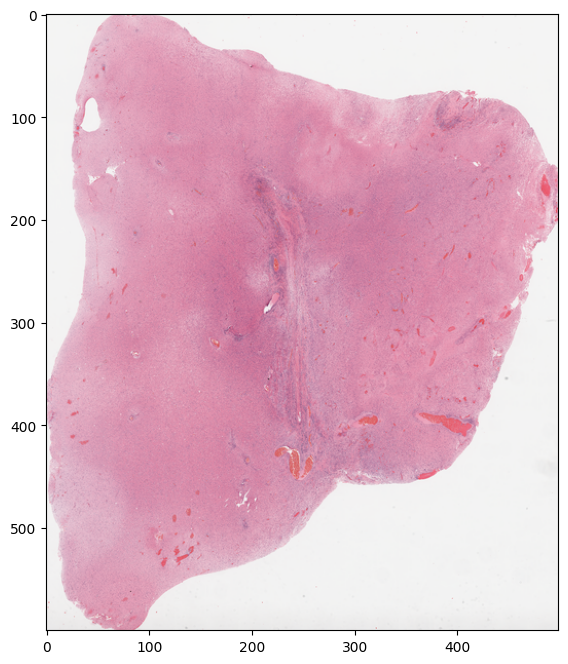

In [24]:
#Convert thumbnail to numpy array and visualize 
slide_thumb_600_np = np.array(slide_thumb_600)
plt.figure(figsize=(8,8))
plt.imshow(slide_thumb_600_np)    

In [25]:
#Get slide dims at each level. Remember that whole slide images store information
#as pyramid at various levels
dims = slide.level_dimensions
print(dims)

((32001, 38474), (8000, 9618), (2000, 2404))


In [26]:
num_levels = len(dims)
print("Number of levels in this image are:", num_levels)

Number of levels in this image are: 3


In [27]:
#By how much are levels downsampled from the original image?
factors = slide.level_downsamples
print("Each level is downsampled by an amount of: ", factors)

Each level is downsampled by an amount of:  (1.0, 4.000166471719693, 16.002329866888516)


In [28]:
#Copy an image from a level
level3_dim = dims[2]
#Give pixel coordinates (top left pixel in the original large image)
#Also give the level number (for level 3 we are providing a valueof 2)
#Size of your output image
print(level3_dim)

(2000, 2404)


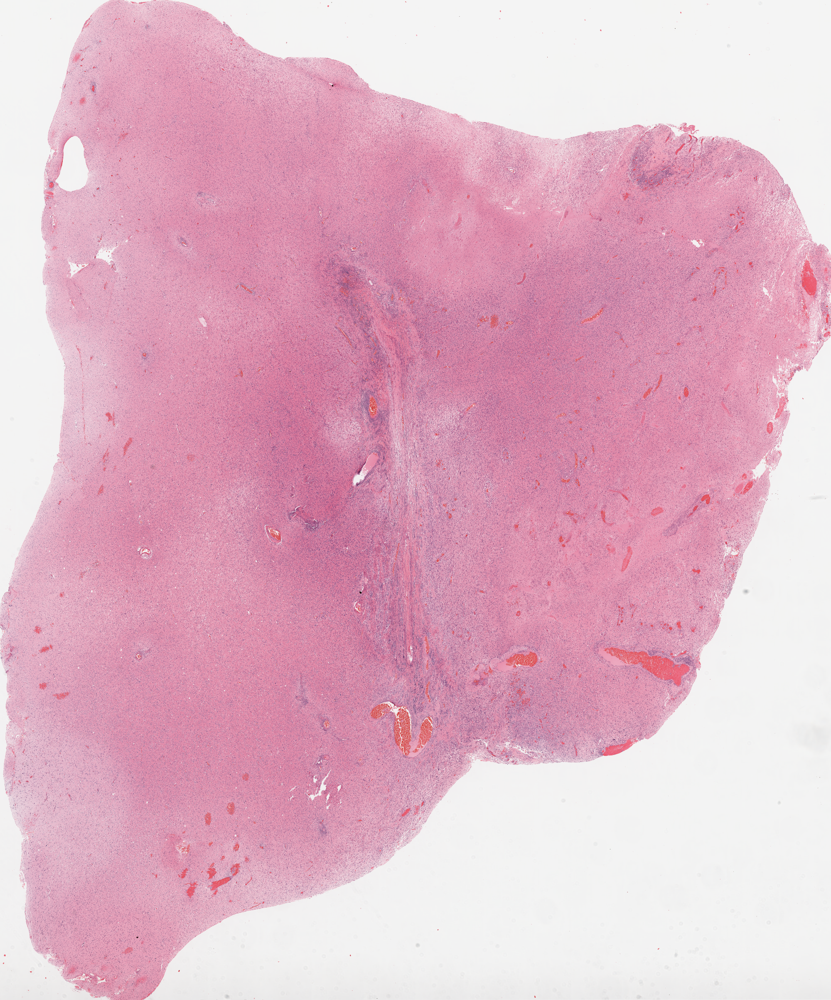

In [29]:
#Remember that the output would be a RGBA image (Not, RGB)
level3_img = slide.read_region((0,0), 2, level3_dim) #Pillow object, mode=RGBA

#Convert the image to RGB
level3_img_RGB = level3_img.convert('RGB')
level3_img_RGB.show()

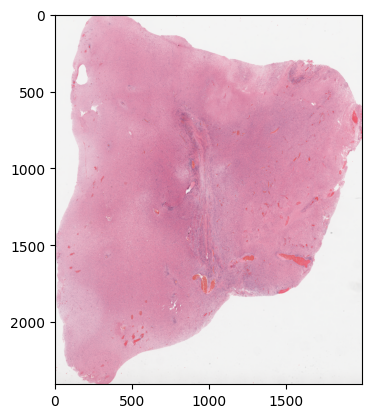

In [30]:
#Convert the image into numpy array for processing
level3_img_np = np.array(level3_img_RGB)
plt.imshow(level3_img_np)


In [31]:
#Return the best level for displaying the given downsample.
SCALE_FACTOR = 32
best_level = slide.get_best_level_for_downsample(SCALE_FACTOR)
#Here it returns the best level to be 2 (third level)
#If you change the scale factor to 2, it will suggest the best level to be 0 (our 1st level)


In [32]:
#################################

#Generating tiles for deep learning training or other processing purposes
#We can use read_region function and slide over the large image to extract tiles
#but an easier approach would be to use DeepZoom based generator.
# https://openslide.org/api/python/

from openslide.deepzoom import DeepZoomGenerator

#Generate object for tiles using the DeepZoomGenerator
tiles = DeepZoomGenerator(slide, tile_size=256, overlap=0, limit_bounds=False)
#Here, we have divided our svs into tiles of size 256 with no overlap. 

In [33]:
#The tiles object also contains data at many levels. 
#To check the number of levels
print("The number of levels in the tiles object are: ", tiles.level_count)

print("The dimensions of data in each level are: ", tiles.level_dimensions)

#Total number of tiles in the tiles object
print("Total number of tiles = : ", tiles.tile_count)


The number of levels in the tiles object are:  17
The dimensions of data in each level are:  ((1, 1), (1, 2), (2, 3), (4, 5), (8, 10), (16, 19), (32, 38), (63, 76), (126, 151), (251, 301), (501, 602), (1001, 1203), (2001, 2405), (4001, 4810), (8001, 9619), (16001, 19237), (32001, 38474))
Total number of tiles = :  25451


In [34]:
#How many tiles at a specific level?
level_num = 11
print("Tiles shape at level ", level_num, " is: ", tiles.level_tiles[level_num])
print("This means there are ", tiles.level_tiles[level_num][0]*tiles.level_tiles[level_num][1], " total tiles in this level")

#Dimensions of the tile (tile size) for a specific tile from a specific layer
tile_dims = tiles.get_tile_dimensions(11, (3,4)) #Provide deep zoom level and address (column, row)


Tiles shape at level  11  is:  (4, 5)
This means there are  20  total tiles in this level


In [35]:
#Tile count at the highest resolution level (level 16 in our tiles)
tile_count_in_large_image = tiles.level_tiles[16] #126 x 151 (32001/256 = 126 with no overlap pixels)
#Check tile size for some random tile
tile_dims = tiles.get_tile_dimensions(16, (120,140))
#Last tiles may not have full 256x256 dimensions as our large image is not exactly divisible by 256
tile_dims = tiles.get_tile_dimensions(16, (125,150))



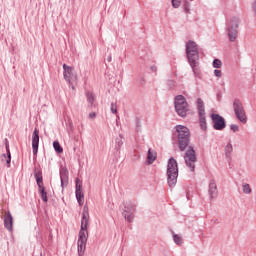

In [36]:
single_tile = tiles.get_tile(16, (62, 70)) #Provide deep zoom level and address (column, row)
single_tile_RGB = single_tile.convert('RGB')
single_tile_RGB.show()

In [37]:
import os
###### Saving each tile to local directory
cols, rows = tiles.level_tiles[16]
!mkdir /content/original_tiles/
tile_dir = "/content/original_tiles/"
for row in range(rows):
    for col in range(cols):
        tile_name = os.path.join(tile_dir, '%d_%d' % (col, row))
        print("Now saving tile with title: ", tile_name)
        temp_tile = tiles.get_tile(16, (col, row))
        temp_tile_RGB = temp_tile.convert('RGB')
        temp_tile_np = np.array(temp_tile_RGB)
        plt.imsave(tile_name + ".png", temp_tile_np)
        


Now saving tile with title:  /content/original_tiles/0_0
Now saving tile with title:  /content/original_tiles/1_0
Now saving tile with title:  /content/original_tiles/2_0
Now saving tile with title:  /content/original_tiles/3_0
Now saving tile with title:  /content/original_tiles/4_0
Now saving tile with title:  /content/original_tiles/5_0
Now saving tile with title:  /content/original_tiles/6_0
Now saving tile with title:  /content/original_tiles/7_0
Now saving tile with title:  /content/original_tiles/8_0
Now saving tile with title:  /content/original_tiles/9_0
Now saving tile with title:  /content/original_tiles/10_0
Now saving tile with title:  /content/original_tiles/11_0
Now saving tile with title:  /content/original_tiles/12_0
Now saving tile with title:  /content/original_tiles/13_0
Now saving tile with title:  /content/original_tiles/14_0
Now saving tile with title:  /content/original_tiles/15_0
Now saving tile with title:  /content/original_tiles/16_0
Now saving tile with tit

KeyboardInterrupt: ignored

In [38]:
""" 
PROPOSED WORKFLOW:  
    
Input: RGB image
Step 1: Convert RGB to OD (optical density)
Step 2: Remove data with OD intensity less than β
Step 3: Calculate  singular value decomposition (SVD) on the OD tuples
Step 4: Create plane from the SVD directions corresponding to the
two largest singular values
Step 5: Project data onto the plane, and normalize to unit length
Step 6: Calculate angle of each point wrt the first SVD direction
Step 7: Find robust extremes (αth and (100−α)th 7 percentiles) of the
angle
Step 8: Convert extreme values back to OD space
Output: Optimal Stain Vectors
"""

import numpy as np
import cv2
from matplotlib import pyplot as plt

In [39]:
#Image downloaded from:
#https://pbs.twimg.com/media/C1MkrgQWQAASbdz.jpg
# img=cv2.imread('images/HnE_Image.jpg', 1)
# img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Io = 240 # Transmitted light intensity, Normalizing factor for image intensities
# alpha = 1  #As recommend in the paper. tolerance for the pseudo-min and pseudo-max (default: 1)
# beta = 0.15 #As recommended in the paper. OD threshold for transparent pixels (default: 0.15)



In [40]:
def norm_HnE(img, Io=240, alpha=1, beta=0.15):


    ######## Step 1: Convert RGB to OD ###################
    ## reference H&E OD matrix.
    #Can be updated if you know the best values for your image. 
    #Otherwise use the following default values. 
    #Read the above referenced papers on this topic. 
    HERef = np.array([[0.5626, 0.2159],
                      [0.7201, 0.8012],
                      [0.4062, 0.5581]])
    ### reference maximum stain concentrations for H&E
    maxCRef = np.array([1.9705, 1.0308])
    
    
    # extract the height, width and num of channels of image
    h, w, c = img.shape
    
    # reshape image to multiple rows and 3 columns.
    #Num of rows depends on the image size (wxh)
    img = img.reshape((-1,3))
    
    # calculate optical density
    # OD = −log10(I)  
    #OD = -np.log10(img+0.004)  #Use this when reading images with skimage
    #Adding 0.004 just to avoid log of zero. 
    
    OD = -np.log10((img.astype(np.float)+1)/Io) #Use this for opencv imread
    #Add 1 in case any pixels in the image have a value of 0 (log 0 is indeterminate)
    
    
    ############ Step 2: Remove data with OD intensity less than β ############
    # remove transparent pixels (clear region with no tissue)
    ODhat = OD[~np.any(OD < beta, axis=1)] #Returns an array where OD values are above beta
    #Check by printing ODhat.min()
    
    ############# Step 3: Calculate SVD on the OD tuples ######################
    #Estimate covariance matrix of ODhat (transposed)
    # and then compute eigen values & eigenvectors.
    eigvals, eigvecs = np.linalg.eigh(np.cov(ODhat.T))
    
    
    ######## Step 4: Create plane from the SVD directions with two largest values ######
    #project on the plane spanned by the eigenvectors corresponding to the two 
    # largest eigenvalues    
    That = ODhat.dot(eigvecs[:,1:3]) #Dot product
    
    ############### Step 5: Project data onto the plane, and normalize to unit length ###########
    ############## Step 6: Calculate angle of each point wrt the first SVD direction ########
    #find the min and max vectors and project back to OD space
    phi = np.arctan2(That[:,1],That[:,0])
    
    minPhi = np.percentile(phi, alpha)
    maxPhi = np.percentile(phi, 100-alpha)
    
    vMin = eigvecs[:,1:3].dot(np.array([(np.cos(minPhi), np.sin(minPhi))]).T)
    vMax = eigvecs[:,1:3].dot(np.array([(np.cos(maxPhi), np.sin(maxPhi))]).T)
    
    
    # a heuristic to make the vector corresponding to hematoxylin first and the 
    # one corresponding to eosin second
    if vMin[0] > vMax[0]:    
        HE = np.array((vMin[:,0], vMax[:,0])).T
        
    else:
        HE = np.array((vMax[:,0], vMin[:,0])).T
    
    
    # rows correspond to channels (RGB), columns to OD values
    Y = np.reshape(OD, (-1, 3)).T
    
    # determine concentrations of the individual stains
    C = np.linalg.lstsq(HE,Y, rcond=None)[0]
    
    # normalize stain concentrations
    maxC = np.array([np.percentile(C[0,:], 99), np.percentile(C[1,:],99)])
    tmp = np.divide(maxC,maxCRef)
    C2 = np.divide(C,tmp[:, np.newaxis])
    
    ###### Step 8: Convert extreme values back to OD space
    # recreate the normalized image using reference mixing matrix 
    
    Inorm = np.multiply(Io, np.exp(-HERef.dot(C2)))
    Inorm[Inorm>255] = 254
    Inorm = np.reshape(Inorm.T, (h, w, 3)).astype(np.uint8)  
    
    # Separating H and E components
    
    H = np.multiply(Io, np.exp(np.expand_dims(-HERef[:,0], axis=1).dot(np.expand_dims(C2[0,:], axis=0))))
    H[H>255] = 254
    H = np.reshape(H.T, (h, w, 3)).astype(np.uint8)
    
    E = np.multiply(Io, np.exp(np.expand_dims(-HERef[:,1], axis=1).dot(np.expand_dims(C2[1,:], axis=0))))
    E[E>255] = 254
    E = np.reshape(E.T, (h, w, 3)).astype(np.uint8)
    
    return (Inorm, H, E)

# img=cv2.imread('images/HnE_Image.jpg', 1)
# img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# norm_img, H_img, E_img = norm_HnE(img, Io=240, alpha=1, beta=0.15)


# plt.imsave("images/HnE_normalized.jpg", Inorm)
# plt.imsave("images/HnE_separated_H.jpg", H)
# plt.imsave("images/HnE_separated_E.jpg", E)

In [41]:
#import pyvips
from openslide import open_slide
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
import tifffile as tiff

#Load the slide file (svs) into an object.
slide = open_slide("download")

# slide_props = slide.properties
# print(slide_props)

#################################
#Extracting a small region and processing it

#Load a level image, normalize the image and digitally extract H and E images
# from normalize_HnE import norm_HnE

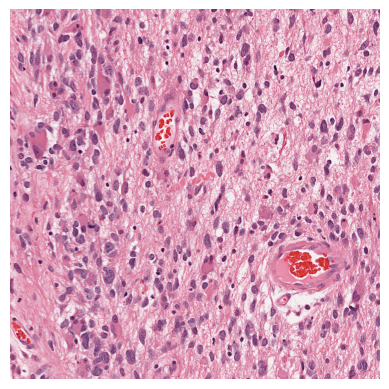

In [42]:
#Extract a small region from the large file (level 0)
#Let us extract a region from somewhere in the middle - coords 16k, 16k
#Extract 1024,1024 region
smaller_region = slide.read_region((16000,16000), 0, (1024,1024))
smaller_region_RGB = smaller_region.convert('RGB')
smaller_region_np = np.array(smaller_region_RGB)

plt.axis('off')
plt.imshow(smaller_region_np)

<ipython-input-40-fbb0cad9f123>:28: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  OD = -np.log10((img.astype(np.float)+1)/Io) #Use this for opencv imread


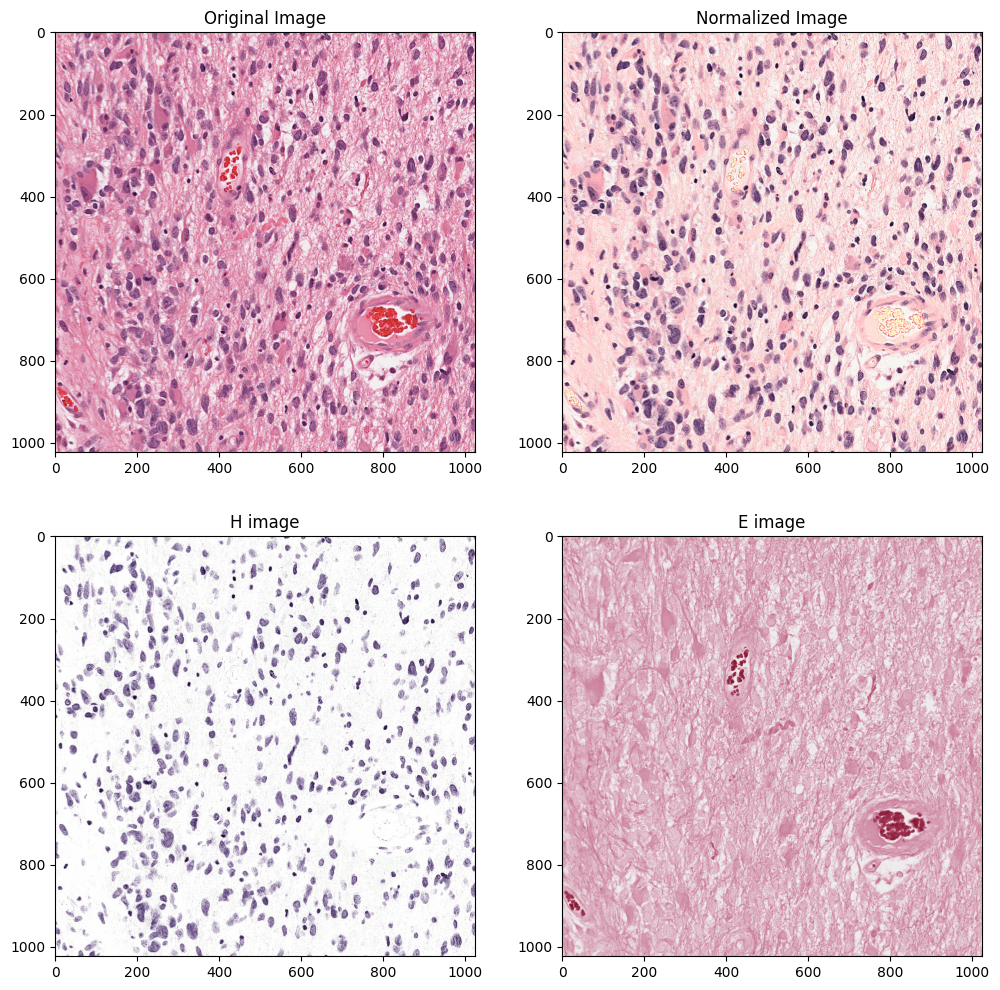

In [43]:
norm_img, H_img, E_img = norm_HnE(smaller_region_np, Io=240, alpha=1, beta=0.15)



plt.figure(figsize=(12, 12))
plt.subplot(221)
plt.title('Original Image')
plt.imshow(smaller_region_np)
plt.subplot(222)
plt.title('Normalized Image')
plt.imshow(norm_img)
plt.subplot(223)
plt.title('H image')
plt.imshow(H_img)
plt.subplot(224)
plt.title('E image')
plt.imshow(E_img)
plt.show()

In [44]:
"""#For blank it throws an Eigenvalues error.
blank = tiff.imread("/content/original_tiles/0_0_original.tif")
norm_img, H_img, E_img = norm_HnE(blank, Io=240, alpha=1, beta=0.15)"""

FileNotFoundError: ignored

In [45]:
#Let us define a function to detect blank tiles and tiles with very minimal information
#This function can be used to identify these tiles so we can make a decision on what to do with them. 
#Here, the function calculates mean and std dev of pixel values in a tile. 
def find_mean_std_pixel_value(img_list):
    
    avg_pixel_value = []
    stddev_pixel_value= []
    for file in img_list:
        image = tiff.imread(file)
        avg = image.mean()
        std = image.std()
        avg_pixel_value.append(avg)
        stddev_pixel_value.append(std)
        
    avg_pixel_value = np.array(avg_pixel_value)  
    stddev_pixel_value=np.array(stddev_pixel_value)
        
    print("Average pixel value for all images is:", avg_pixel_value.mean())
    print("Average std dev of pixel value for all images is:", stddev_pixel_value.mean())
    
    return(avg_pixel_value, stddev_pixel_value)


In [ ]:
"""
#Let us read some blank tiles, some partial tiles and some good ones to find out
#the mean and std dev of pixel values. 
#These numbers can be used to identify 'problematic' slides that we can bypass from our processing. 
import glob
import numpy as np

orig_tile_dir_name = "/content/original_tiles/"

blank_img_list=(glob.glob(orig_tile_dir_name+"blank/*.tif"))
partial_img_list=(glob.glob(orig_tile_dir_name+"partial/*.tif"))
good_img_list=(glob.glob(orig_tile_dir_name+"good/*.tif"))

blank_img_stats = find_mean_std_pixel_value(blank_img_list)
partial_img_stats = find_mean_std_pixel_value(partial_img_list)
good_img_stats = find_mean_std_pixel_value(good_img_list)

"""

In [ ]:
"""
Average pixel value for all blank images is: 244.45962306699482
Average std dev of pixel value for all blank images is: 0.9214953206879862
Average pixel value for all partial images is: 242.93900954932494
Average std dev of pixel value for all partial images is: 10.427143587023263
Average pixel value for all good images is: 208.8701055190142
Average std dev of pixel value for all good images is: 37.36282416278772
"""

In [46]:
###############################################
#Generating tiles and processing
#We can use read_region function and slide over the large image to extract tiles
#but an easier approach would be to use DeepZoom based generator.
# https://openslide.org/api/python/
from openslide.deepzoom import DeepZoomGenerator

#Generate object for tiles using the DeepZoomGenerator
tiles = DeepZoomGenerator(slide, tile_size=256, overlap=0, limit_bounds=False)
#Here, we have divided our svs into tiles of size 256 with no overlap. 

#The tiles object also contains data at many levels. 
#To check the number of levels
print("The number of levels in the tiles object are: ", tiles.level_count)
print("The dimensions of data in each level are: ", tiles.level_dimensions)
#Total number of tiles in the tiles object
print("Total number of tiles = : ", tiles.tile_count)


The number of levels in the tiles object are:  17
The dimensions of data in each level are:  ((1, 1), (1, 2), (2, 3), (4, 5), (8, 10), (16, 19), (32, 38), (63, 76), (126, 151), (251, 301), (501, 602), (1001, 1203), (2001, 2405), (4001, 4810), (8001, 9619), (16001, 19237), (32001, 38474))
Total number of tiles = :  25451


In [47]:
###### processing and saving each tile to local directory
cols, rows = tiles.level_tiles[16]
!mkdir /content/original_tiles/H_tiles/
!mkdir /content/original_tiles/E_tiles/
!mkdir /content/original_tiles/original_tiles/
!mkdir /content/original_tiles/normalized_tiles/
tile_dir = "/content/original_tiles/"

orig_tile_dir_name = "/content/original_tiles/original_tiles/"
norm_tile_dir_name = "/content/original_tiles/normalized_tiles/"
H_tile_dir_name = "/content/original_tiles/H_tiles/"
E_tile_dir_name = "/content/original_tiles/E_tiles/"


In [48]:
for row in range(rows):
    for col in range(cols):
        tile_name = str(col) + "_" + str(row)
        #tile_name = os.path.join(tile_dir, '%d_%d' % (col, row))
        #print("Now processing tile with title: ", tile_name)
        temp_tile = tiles.get_tile(16, (col, row))
        temp_tile_RGB = temp_tile.convert('RGB')
        temp_tile_np = np.array(temp_tile_RGB)
        #Save original tile
        tiff.imsave(orig_tile_dir_name+tile_name + "_original.tif", temp_tile_np)
        
        if temp_tile_np.mean() < 230 and temp_tile_np.std() > 15:
            print("Processing tile number:", tile_name)
            norm_img, H_img, E_img = norm_HnE(temp_tile_np, Io=240, alpha=1, beta=0.15)
        #Save the norm tile, H and E tiles      
            
            tiff.imsave(norm_tile_dir_name+tile_name + "_norm.tif", norm_img)
            tiff.imsave(H_tile_dir_name+tile_name + "_H.tif", H_img)
            tiff.imsave(E_tile_dir_name+tile_name + "_E.tif", E_img)
            
        else:
            print("NOT PROCESSING TILE:", tile_name)
        
        
        

<ipython-input-48-4c28173c23d7>:10: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(orig_tile_dir_name+tile_name + "_original.tif", temp_tile_np)


NOT PROCESSING TILE: 0_0
NOT PROCESSING TILE: 1_0
NOT PROCESSING TILE: 2_0
NOT PROCESSING TILE: 3_0
NOT PROCESSING TILE: 4_0
NOT PROCESSING TILE: 5_0
NOT PROCESSING TILE: 6_0
NOT PROCESSING TILE: 7_0
NOT PROCESSING TILE: 8_0
NOT PROCESSING TILE: 9_0
NOT PROCESSING TILE: 10_0
NOT PROCESSING TILE: 11_0
NOT PROCESSING TILE: 12_0
NOT PROCESSING TILE: 13_0
NOT PROCESSING TILE: 14_0
NOT PROCESSING TILE: 15_0
Processing tile number: 16_0
Processing tile number: 17_0
Processing tile number: 18_0


<ipython-input-40-fbb0cad9f123>:28: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  OD = -np.log10((img.astype(np.float)+1)/Io) #Use this for opencv imread
<ipython-input-48-4c28173c23d7>:17: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(norm_tile_dir_name+tile_name + "_norm.tif", norm_img)
<ipython-input-48-4c28173c23d7>:18: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(H_tile_dir_name+tile_name + "_H.tif", H_img)
<ipython-input-48-4c28173c23d7>:19: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(E_tile_dir_name+tile_name + "_E.tif", E_img)


Processing tile number: 19_0
Processing tile number: 20_0
Processing tile number: 21_0
Processing tile number: 22_0
Processing tile number: 23_0
Processing tile number: 24_0
Processing tile number: 25_0
Processing tile number: 26_0
Processing tile number: 27_0
NOT PROCESSING TILE: 28_0
NOT PROCESSING TILE: 29_0
NOT PROCESSING TILE: 30_0
NOT PROCESSING TILE: 31_0
NOT PROCESSING TILE: 32_0
NOT PROCESSING TILE: 33_0
NOT PROCESSING TILE: 34_0
NOT PROCESSING TILE: 35_0
NOT PROCESSING TILE: 36_0
NOT PROCESSING TILE: 37_0
NOT PROCESSING TILE: 38_0
NOT PROCESSING TILE: 39_0
NOT PROCESSING TILE: 40_0
NOT PROCESSING TILE: 41_0
NOT PROCESSING TILE: 42_0
NOT PROCESSING TILE: 43_0
NOT PROCESSING TILE: 44_0
NOT PROCESSING TILE: 45_0
NOT PROCESSING TILE: 46_0
NOT PROCESSING TILE: 47_0
NOT PROCESSING TILE: 48_0
NOT PROCESSING TILE: 49_0
NOT PROCESSING TILE: 50_0
NOT PROCESSING TILE: 51_0
NOT PROCESSING TILE: 52_0
NOT PROCESSING TILE: 53_0
NOT PROCESSING TILE: 54_0
NOT PROCESSING TILE: 55_0
NOT PROCESS

KeyboardInterrupt: ignored

In [ ]:
###################################################

#You can also try using pyvips to create an image pyramid from stored tiles. 